# Image Denoising

В этом проекте я реализую [REDNet](https://arxiv.org/abs/1603.09056) для удаления шума с изображений, а затем сравню результаты с BM3D.

Я обучила модели разного размера, а также проверила несколько функций потерь. В оригинальной статье используется L2, но сейчас L1 более популярен, потому что картинки получаются более четкими. Также утверждается, что [L2 плохо коррелирует с человеческим восприятием качества](https://arxiv.org/pdf/1511.08861.pdf), так как чувствительность к разным характеристикам. Функцию потерь, основанную на SSIM, я тоже попробовала, потому что иногда она [дает результаты лучше, чем L1 и L2](https://www.jstage.jst.go.jp/article/sss/2021/0/2021_65/_pdf).

В качестве тренировочных данных я решила взять [SIDD](https://www.eecs.yorku.ca/~kamel/sidd/index.php), хотя в оригинальной статье используется Berkeley Segmentation Dataset с искусственно добавленным шумом. SIDD часто используется как бенчмарк для современных моделей, удаляющих шум с изображений. Также авторы датасета утверждают, что обученные на их данных модели показывают результаты лучше, чем искусственно зашумленные.

В наборе данных очень большие по размеру изображения, что создает боттлнек при чтении данных. Я разрезала эти изображения на кусочки 256x256, поскольку модель все равно обучается на патчах небольшого размера.

Я немного модернизировала архитектуру, заменив активации c ReLU на GeLU. Гиперпараметры взяты из статьи.

Логи обучения модели можно посмотреть в [W&B](https://wandb.ai/ngtvx/comp_photo_project)

## REDNet Implementation

In [2]:
!pip3 -q install wandb pytorch-msssim bm3d
!pip3 -q install --upgrade --no-cache-dir gdown

In [ ]:
import glob
from itertools import repeat
import os
import random
import shutil
from timeit import default_timer as timer
from typing import Tuple, Dict, Optional

import bm3d
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from pytorch_msssim import SSIM
from skimage.metrics import structural_similarity
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as T
from tqdm import tqdm
import wandb

In [ ]:
!curl -L https://competitions.codalab.org/my/datasets/download/a26784fe-cf33-48c2-b61f-94b299dbc0f2 -o sidd_srgb.zip
!unzip -q sidd_srgb.zip && rm sidd_srgb.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 6309M  100 6309M    0     0  40.8M      0  0:02:34  0:02:34 --:--:-- 43.8M


In [ ]:
SEED = 3407

In [ ]:
# very high resultion which makes io a bottleneck during training
train_path = "./SIDD_Small_sRGB_Only/train"

os.makedirs(train_path, exist_ok=True)
n_examples = 0
for example_dir in tqdm(glob.glob("./SIDD_Small_sRGB_Only/Data/*")):
    noisy_img = Image.open(glob.glob(example_dir + "/NOISY*.PNG")[0])
    clean_img = Image.open(glob.glob(example_dir + "/GT*.PNG")[0])

    w, h = noisy_img.size
    cut_size_x, cut_size_y = 256, 256
    for x_idx in range(0, w, cut_size_x):
        for y_idx in range(0, h, cut_size_y):
            crop_box = (x_idx, y_idx, x_idx + cut_size_x, y_idx + cut_size_y)

            new_example_path = train_path + f"/{n_examples}"
            os.makedirs(new_example_path, exist_ok=True)

            subimg = noisy_img.crop(crop_box)
            subimg.save(new_example_path + "/NOISY.PNG")

            subimg = clean_img.crop(crop_box)
            subimg.save(new_example_path + "/GT.PNG")

            n_examples += 1


100%|██████████| 160/160 [32:14<00:00, 12.09s/it]


In [ ]:
!rm -r ./SIDD_Small_sRGB_Only/Data/

In [ ]:
# generate a few images for validation
torch.manual_seed(SEED)

valid_path = "./SIDD_Small_sRGB_Only/valid"

valid_pair_paths = np.random.choice(
    glob.glob(train_path + "/*"),
    size=64,
    replace=False,
)

os.makedirs(valid_path, exist_ok=True)
for pair_path in valid_pair_paths:
    shutil.move(pair_path, valid_path)

### Data

In [ ]:
class ImageDataset(torch.utils.data.Dataset):

    def __init__(self, image_dir: str, patch_size: Optional[Tuple[int]] = None):
        self.image_pairs = glob.glob(image_dir + "/*")

        transforms = []
        if patch_size is not None:
            transforms.append(T.RandomCrop(patch_size))
        transforms.append(T.ConvertImageDtype(torch.float))
        self.transforms = T.Compose(transforms)
    
    def __getitem__(self, idx: int) -> Dict:
        example_dir = self.image_pairs[idx]

        img_noisy = torchvision.io.read_image(glob.glob(example_dir + "/NOISY*.PNG")[0])
        img_clean = torchvision.io.read_image(glob.glob(example_dir + "/GT*.PNG")[0])

        img_noisy, img_clean = torch.split(
            self.transforms(torch.vstack([img_noisy, img_clean])),
            split_size_or_sections=3,
        )

        return dict(
            noisy=img_noisy,
            clean=img_clean,
        )
    
    def __len__(self) -> int:
        return len(self.image_pairs)

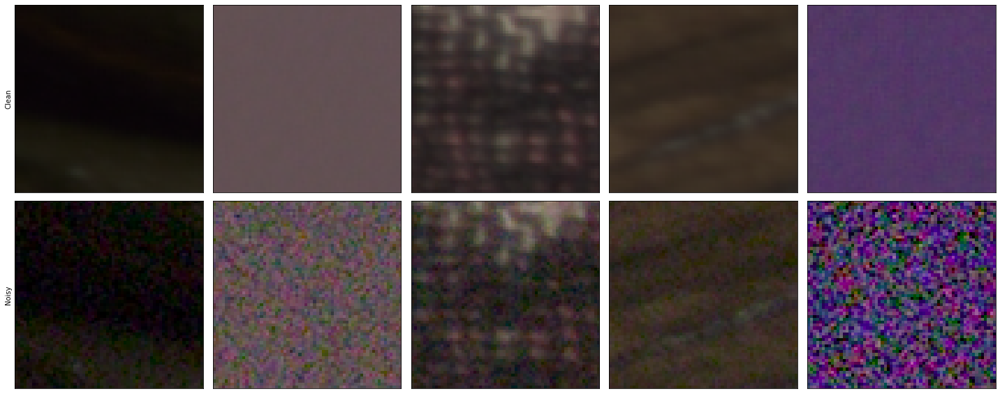

In [ ]:
# visualize some noise examples
torch.manual_seed(SEED)

dataset = ImageDataset(train_path, (64, 64))

n_pairs = 5
size_len = 4

fig = plt.figure(figsize=(size_len * n_pairs, size_len * 2))
axs = fig.subplots(2, n_pairs)

for i in range(n_pairs):
    patches = dataset[i]
    for j, label in enumerate(["clean", "noisy"]):
        axs[j, i].imshow(patches[label].permute(1, 2, 0))
        axs[j, i].set_xticks([])
        axs[j, i].set_yticks([])

axs[0, 0].set_ylabel("Clean")
axs[1, 0].set_ylabel("Noisy")

plt.tight_layout()
plt.show()

### Model

In [22]:
class ConvReLU(nn.Module):
    
    def __init__(self, in_channels, out_channels, kernel_size=3, padding=1):
        super(ConvReLU, self).__init__()
        
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, 
                              padding=padding)
    
    def forward(self, x):
        return F.gelu(self.conv(x))


class ConvTransposeReLU(nn.Module):
    
    def __init__(self, in_channels, out_channels, kernel_size=3, padding=1):
        super(ConvTransposeReLU, self).__init__()

        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=kernel_size, 
                                       padding=padding)
    
    def forward(self, x):
        return F.gelu(self.deconv(x))


class REDNet(nn.Module):

    def __init__(self, num_layers: int, num_features: int = 64):
        super(REDNet, self).__init__()

        layers = []
        in_channels = 3
        for _ in range(num_layers):
            layers.append(ConvReLU(in_channels, num_features, kernel_size=3, padding=1))
            in_channels = num_features
        self.conv_layers = nn.Sequential(*layers)

        layers = []
        out_channels = 3
        for i in range(num_layers - 1):
            layers.append(ConvTransposeReLU(num_features, out_channels, kernel_size=3, padding=1))
            out_channels = num_features
        layers = layers[::-1]
        self.deconv_layers = nn.Sequential(*layers)

    def forward(self, x):
        out = x + self.deconv_layers(self.conv_layers(x))
        return F.gelu(out)


class REDNet10(REDNet):

    def __init__(self, num_features):
        super(REDNet10, self).__init__(5, num_features)


class REDNet20(REDNet):

    def __init__(self, num_features):
        super(REDNet20, self).__init__(10, num_features)


class REDNet30(REDNet):

    def __init__(self, num_features):
        super(REDNet30, self).__init__(15, num_features)

### Training tools

In [ ]:
class MetricTracker:
    
    def __init__(self, keys):
        self.data = {key: None for key in keys}
        self.reset()
    
    def reset(self):
        for key in self.data.keys():
            self.data[key] = dict(total=0, count=0, avg=0)
    
    def update(self, key, value):
        self.data[key]["total"] += value
        self.data[key]["count"] += 1
        self.data[key]["avg"] = self.data[key]["total"] / self.data[key]["count"]
    
    def all_avg(self):
        return {key: self.data[key]["avg"] for key in self.data.keys()}

In [ ]:
class Writer:

    def __init__(self, proj_name, config):
        wandb.login()

        self.proj_name = proj_name
        self.config = config

        self.cur_run = None
    
    def __enter__(self):
        self.cur_run = wandb.init(
            project=self.proj_name, 
            config=self.config, 
            reinit=True
        )

        self.step = 0
        self.mode = None
        self.cur_time = timer()

        return self

    def __exit__(self, exc_type, exc_val, exc_tb):
        self.cur_run.finish()
        self.cur_run = None

    def set_step(self, step, mode):
        step_skip = step - self.step
        self.step = step
        self.mode = mode
        if step > 0:
            self.add_scalar(
                "steps_per_sec", 
                step_skip / (timer() - self.cur_time)
            )

        self.cur_time = timer()
    
    def get_logging_name(self, name):
        return "_".join((name, self.mode))
    
    def add_scalar(self, name, value):
        wandb.log({self.get_logging_name(name): value}, step=self.step)
    
    def add_images(self, name, imgs):
        imgs = [T.functional.to_pil_image(img) for img in imgs]
        wandb.log({
            self.get_logging_name(name): [wandb.Image(img) for img in imgs]
        }, step=self.step)


In [23]:
def prepare_model(model_name, n_features):
    if model_name == "REDNet10":
        model = REDNet10(n_features)
    elif model_name == "REDNet20":
        model = REDNet20(n_features)
    elif model_name == "REDNet30":
        model = REDNet30(n_features)
    else:
        raise ValueError(f"Unknown REDNet setup: {model_name}")
    
    return model

In [3]:
def inf_loop(dataloader):
    for loader in repeat(dataloader):
        yield from loader

In [4]:
def set_seed(seed):
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

In [5]:
def get_grad_norm(model):
    params = [p for p in model.parameters() if p.grad is not None]
    total_norm = torch.norm(torch.stack([torch.norm(p.grad.detach(), p=2).cpu() for p in params]), p=2)
    return total_norm.item()

In [6]:
class SSIMCriterion:

    def __init__(self):
        self.ssim = SSIM(data_range=1.0, size_average=True, channel=3)
    
    def __call__(self, true_imgs, pred_imgs):
        return 1. - self.ssim(true_imgs, pred_imgs)

In [7]:
def train_epoch(epoch, model, writer, dataloader, optimizer, criterion, tracker, 
                device, epoch_length):
    for i, batch_data in enumerate(inf_loop(dataloader), 1):
        if i > epoch_length:
            break
        
        noisy_imgs = batch_data["noisy"].to(device)
        clean_imgs = batch_data["clean"].to(device)

        out = model(noisy_imgs)

        optimizer.zero_grad()
        loss = criterion(out, clean_imgs)
        loss.backward()
        optimizer.step()

        tracker.update("loss", loss.item())
        tracker.update("grad_norm", get_grad_norm(model))

        if i % 50 == 0 or i == epoch_length:
            writer.set_step(epoch * epoch_length + i, "train")
            for metric_name, value in tracker.all_avg().items():
                    writer.add_scalar(metric_name, value)

            writer.add_images("source", noisy_imgs[:3].detach().cpu())
            writer.add_images("truth", clean_imgs[:3].detach().cpu())
            writer.add_images("output", out[:3].detach().cpu())

            tracker.reset()

In [8]:
@torch.no_grad()
def validate(model, writer, dataloader, criterion, tracker, device):
    for i, batch_data in enumerate(dataloader, 1):
        noisy_imgs = batch_data["noisy"].to(device)
        clean_imgs = batch_data["clean"].to(device)

        out = model(noisy_imgs)

        loss = criterion(out, clean_imgs)

        tracker.update("loss", loss.item())
    
    for metric_name, value in tracker.all_avg().items():
        writer.add_scalar(metric_name, value)

    writer.add_images("source", noisy_imgs[:3].detach().cpu())
    writer.add_images("truth", clean_imgs[:3].detach().cpu())
    writer.add_images("output", out[:3].detach().cpu())
    
    tracker.reset()

In [9]:
def train_model(model, num_epochs, writer, dataloaders, optimizer, criterion,
                epoch_length=None):
    if epoch_length is None:
        epoch_length = len(dataloaders["train"])

    device = "cuda" if torch.cuda.is_available() else "cpu"
    model = model.to(device)

    train_tracker = MetricTracker(["loss", "grad_norm"])
    valid_tracker = MetricTracker(["loss"])

    for i in range(num_epochs):
        train_epoch(i, model, writer, dataloaders["train"], optimizer, criterion,
                    train_tracker, device, epoch_length)
        writer.set_step((i + 1) * epoch_length, "valid")
        validate(model, writer, dataloaders["valid"], criterion, valid_tracker, device)
    
    return model

In [10]:
def get_criterion(criterion_name):
    if criterion_name == "L1":
        criterion = nn.L1Loss()
    elif criterion_name == "L2":
        criterion = nn.MSELoss()
    elif criterion_name == "SSIM":
        criterion = SSIMCriterion()
    else:
        raise ValueError(f"Unknown criterion: {criterion_name}")

    return criterion

In [11]:
def run_experiment(params):
    set_seed(SEED)

    dataloaders = dict(
        train=torch.utils.data.DataLoader(
            ImageDataset(train_path, params["patch_size"]),
            batch_size=params["batch_size"],
            pin_memory=True,
            num_workers=2,
            drop_last=True,
            shuffle=True,
        ),
        valid=torch.utils.data.DataLoader(
            ImageDataset(valid_path, params["patch_size"]),
            batch_size=params["batch_size"],
            pin_memory=True,
            num_workers=2,
            shuffle=True
        )
    )

    criterion = get_criterion(params["criterion"])

    model = prepare_model(**params["model"])
    optimizer = torch.optim.Adam(model.parameters(), **params["optimizer_params"])
    with Writer("comp_photo_project", params) as writer:
        train_model(model, params["num_epochs"], writer, dataloaders, 
                    optimizer, criterion, params["epoch_length"])
    
    return model

### Actual training process

In [ ]:
params = {
    "model": {
        "model_name": "REDNet10",
        "n_features": 64,
    },
    "optimizer_params": {
        "lr": 1e-4,
    },
    "num_epochs": 50,
    "epoch_length": 200,
    "batch_size": 64,
    "patch_size": (64, 64),
    "criterion": "L1",
}

In [ ]:
model = run_experiment(params)

torch.save(model.cpu().state_dict(), "./rednet10-64channels-L1.pth")

grad_norm_train,▂▁▂▃▅▃▅▅▅▅▆▅▇█▆██▇▆▆▅▇▆▇▅▇▅▅▆▇▄▄▅▄▅▄▆▄▆▄
loss_train,█▆▆▆▆▅▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_valid,███▇▆▅▅▄▄▄▄▄▃▃▃▂▂▂▂▂▂▂▂▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
steps_per_sec_train,▂▄▁▂▆▁▄▂▇▆▃▃▇▂▄▆▃▃▄█▆▃▁▅▆▃▄▄▁▂▆▇▄▃▅▆▃▄▇▄
steps_per_sec_valid,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_norm_train,0.08746
loss_train,0.01289
loss_valid,0.01275
steps_per_sec_train,3.12057
steps_per_sec_valid,0.0


In [ ]:
params["criterion"] = "L2"

model = run_experiment(params)

torch.save(model.cpu().state_dict(), "./rednet10-64channels-L2.pth")

grad_norm_train,▂▁▃▇▄▄▆▅▆▆█▃▆▅▅▅▄▃▄▄▃▃▃▆▃▅▃▃▄▄▃▄▃▃▃▃▄▃▃▃
loss_train,█▇▇▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_valid,█▇█▆▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
steps_per_sec_train,▆▇▁▂██▆▇█▇▆▆▇▆▇▇█▆▇█▇▇▇██▆█▇▆▆█▇▆▆▇█▇▆▆▆
steps_per_sec_valid,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_norm_train,0.0058
loss_train,0.00037
loss_valid,0.00032
steps_per_sec_train,3.0171
steps_per_sec_valid,0.0


In [ ]:
params["criterion"] = "SSIM"

model = run_experiment(params)

torch.save(model.cpu().state_dict(), "./rednet10-64channels-SSIM.pth")

grad_norm_train,▂▁▆▇████▇▆▆▆▅▆▆▇▅▅▆▄▆▅▅▄▅▄▄▅▅▄▄▅▄▅▅▅▄▄▄▅
loss_train,██▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_valid,██▅▃▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
steps_per_sec_train,▂▅▁▂█▇▃▄▇▇▄▄▇▃▅█▇▄▅▇▆▅▅▅▅▃▇█▃▂▇▇▃▄▅▆▄▄▅▃
steps_per_sec_valid,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_norm_train,0.74354
loss_train,0.07183
loss_valid,0.0667
steps_per_sec_train,3.05745
steps_per_sec_valid,0.0


In [ ]:
params["criterion"] = "L1"
params["model"]["n_features"] = 128

model = run_experiment(params)

torch.save(model.cpu().state_dict(), "./rednet10-128channels-L1.pth")

grad_norm_train,▁▁▄█▆▆▇▇▆▅▄▂▄▅▆▅▄▄▄▆▆▅▃▅▆▅▃▃▃▃▃▅▃▃▃▃▄▄▂▄
loss_train,█▇▅▄▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_valid,█▇▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
steps_per_sec_train,▆▇▆▆▇▇▇▆▇▇▆▇▇▆▇█▇▇▇██▇▇▁▇▆██▇▇██▇▇▇▇▇▆▇▆
steps_per_sec_valid,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_norm_train,0.06082
loss_train,0.00983
loss_valid,0.00959
steps_per_sec_train,2.72072
steps_per_sec_valid,0.0


In [ ]:
params["model"]["n_features"] = 64
params["model"]["model_name"] = "REDNet20"
params["num_epochs"] = 80

model = run_experiment(params)

torch.save(model.cpu().state_dict(), "./rednet20-64channels-L1.pth")

grad_norm_train,▁▁▂▁▁▂▃▅▂▄▃▃▃▄▇▄▆▅▅▆▇▇▅█▆▆▆▇▅▆▆▄▇▇▅▅▆▆█▄
loss_train,█▅▅▅▅▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_valid,█▆▆▅▅▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
steps_per_sec_train,▁▂▃▇▅▆▇▄▆▄▆▆▃▂▃▄▆▇▅▄▄▆▇▆▃▃▆▅█▆▇▄▅▂▅▅▇▂▃▄
steps_per_sec_valid,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
grad_norm_train,0.11524
loss_train,0.0102
loss_valid,0.00959
steps_per_sec_train,2.64707
steps_per_sec_valid,0.0


## Comparison

In [12]:
# Download all models
models = {
    "rednet10-64channels-l1": "1ldvIvidvYFLvz717HN0GycQOSF8gU4sA",
    "rednet10-64channels-l2": "1wn7MLe2INDc_otwvtT56Ir2MrkUzK9MF",
    "rednet10-64channels-ssim": "12bjijzkhh314a02I1SSbDPdCNdf02y8_",
    "rednet10-128channels-l1": "1rgd1P_dAXB-saXpnR5L2AcduSNJTgd-X",
    "rednet20-64channels-l1": "1fXUBBT5gWHnNWJM1Qu4jcUiVrVvhDATq",
}

In [14]:
os.makedirs("./models", exist_ok=True)

for model_name, gdrive_id in models.items():
    model_path = f"./models/{model_name}.pth"
    !gdown {gdrive_id} -O {model_path}

Downloading...
From: https://drive.google.com/uc?id=1ldvIvidvYFLvz717HN0GycQOSF8gU4sA
To: /content/models/rednet10-64channels-l1.pth
100% 1.05M/1.05M [00:00<00:00, 148MB/s]
Downloading...
From: https://drive.google.com/uc?id=1wn7MLe2INDc_otwvtT56Ir2MrkUzK9MF
To: /content/models/rednet10-64channels-l2.pth
100% 1.05M/1.05M [00:00<00:00, 131MB/s]
Downloading...
From: https://drive.google.com/uc?id=12bjijzkhh314a02I1SSbDPdCNdf02y8_
To: /content/models/rednet10-64channels-ssim.pth
100% 1.05M/1.05M [00:00<00:00, 118MB/s]
Downloading...
From: https://drive.google.com/uc?id=1rgd1P_dAXB-saXpnR5L2AcduSNJTgd-X
To: /content/models/rednet10-128channels-l1.pth
100% 4.17M/4.17M [00:00<00:00, 241MB/s]
Downloading...
From: https://drive.google.com/uc?id=1fXUBBT5gWHnNWJM1Qu4jcUiVrVvhDATq
To: /content/models/rednet20-64channels-l1.pth
100% 2.54M/2.54M [00:00<00:00, 226MB/s]


In [17]:
# download test images
images = {
    "lenna": "1h21aYFLu5YvHFe4cnQRQUXpfZGW3a1vj",
    "barbara": "1rFW8tKVRYi5YfMR3achnHnSNTupdn498",
    "lion": "15iu3peZB-XrtBR_Qvnr3bHinlhz8Sm4q",
    "foxes": "1NBw3q9FEbDSFvK9iEc40z_H0YqzLJsPl",
}

In [20]:
os.makedirs("./images", exist_ok=True)

for image_name, gdrive_id in images.items():
    image_path = f"./images/{image_name}.png"
    !gdown {gdrive_id} -O {image_path}

Downloading...
From: https://drive.google.com/uc?id=1h21aYFLu5YvHFe4cnQRQUXpfZGW3a1vj
To: /content/images/lenna.png
100% 474k/474k [00:00<00:00, 124MB/s]
Downloading...
From: https://drive.google.com/uc?id=1rFW8tKVRYi5YfMR3achnHnSNTupdn498
To: /content/images/barbara.png
100% 185k/185k [00:00<00:00, 103MB/s]
Downloading...
From: https://drive.google.com/uc?id=15iu3peZB-XrtBR_Qvnr3bHinlhz8Sm4q
To: /content/images/lion.png
100% 302k/302k [00:00<00:00, 117MB/s]
Downloading...
From: https://drive.google.com/uc?id=1NBw3q9FEbDSFvK9iEc40z_H0YqzLJsPl
To: /content/images/foxes.png
100% 314k/314k [00:00<00:00, 8.68MB/s]


In [24]:
loaded_models = []
device = "cuda" if torch.cuda.is_available() else "cpu"

for model_name in models.keys():
    model_path = f"./models/{model_name}.pth"

    model_type, n_channels = model_name.split("-")[:2]
    n_channels = int(n_channels[:-8])
    model_type = "REDNet" + model_type[-2:]

    model = prepare_model(model_type, n_channels)
    model.load_state_dict(torch.load(model_path))

    loaded_models.append((model.cuda(), model_name))

In [25]:
def show_img(ax, img, label):
    ax.imshow(img)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel(label)

In [26]:
def run_example(img_path, device, size_len=6, sigma=0.1):
    fig = plt.figure(figsize=(size_len * 3, size_len * 3))
    axs = fig.subplots(3, 3)

    clean_img = Image.open(img_path).convert("RGB")
    clean_img = T.functional.to_tensor(clean_img).permute(1, 2, 0)
    
    show_img(axs[1, 1], clean_img, "original")

    # noisy image
    img = torch.clamp(clean_img + torch.randn_like(clean_img) * sigma, 0., 1.)
    ssid_value = structural_similarity(
        clean_img.numpy(), img.numpy(), multichannel=True, data_range=1.
    )
    show_img(axs[0, 0], img, f"noisy\nSSID={ssid_value:.6f}")

    img = img.permute(2, 0, 1)
    img = img.unsqueeze(0).to(device)

    # deep denoising
    for i, (model, model_name) in enumerate(loaded_models, 1):
        with torch.no_grad():
            denoised = model(img).squeeze(0)

        if i >= 4:
            i += 1

        denoised = torch.clamp(denoised.cpu(), 0., 1.).permute(1, 2, 0)
        ssid_value = structural_similarity(
            clean_img.numpy(), denoised.numpy(), multichannel=True, data_range=1.
        )

        x, y = i % 3, i // 3
        show_img(axs[y, x], denoised, f"{model_name}\nSSID={ssid_value:.6f}")

    img = img.cpu().squeeze(0).permute(1, 2, 0)

    # bm3d
    denoised = bm3d.bm3d(img.numpy(), sigma_psd=30/255, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
    ssid_value = structural_similarity(
        clean_img.numpy(), denoised, multichannel=True, data_range=1.
    )
    show_img(axs[2, 1], denoised, f"BM3D\nSSID={ssid_value:.6f}")

    axs[-1, -1].axis("off")

    plt.tight_layout()
    plt.show()

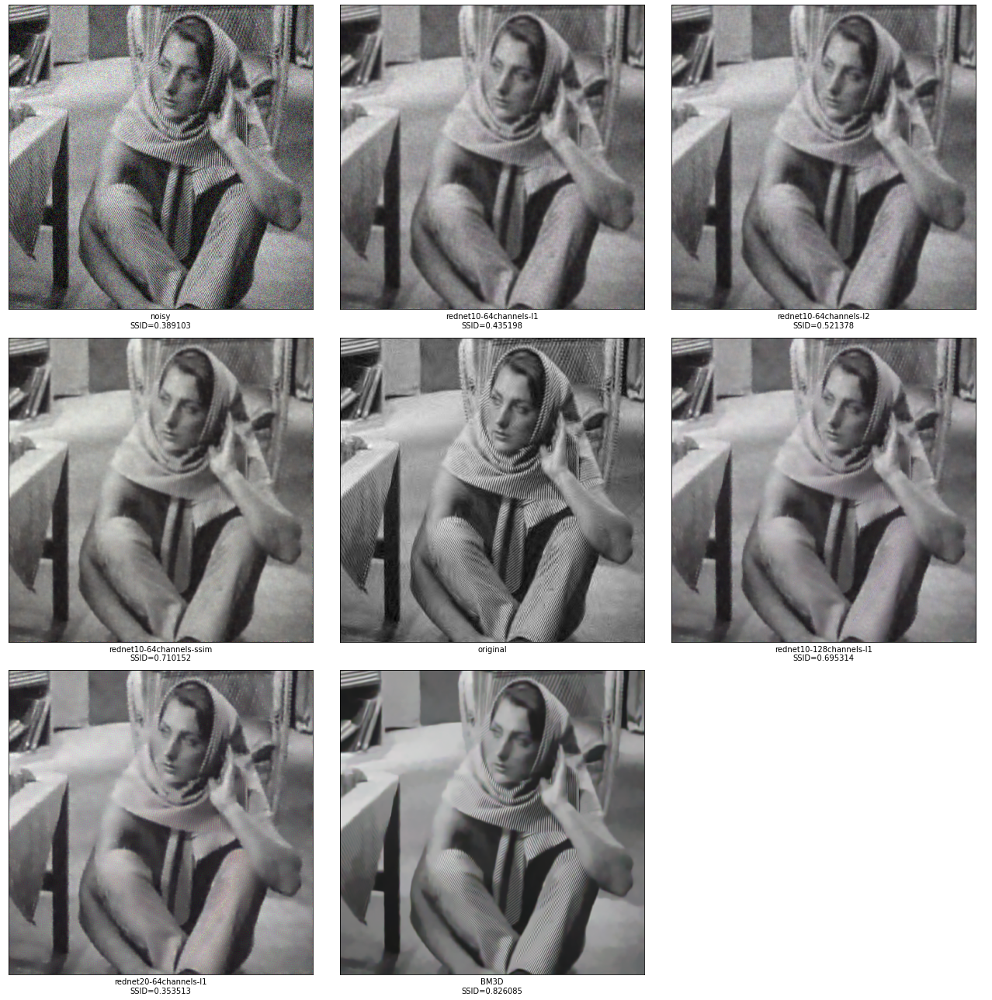

In [27]:
run_example("./images/barbara.png", device, sigma=0.1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


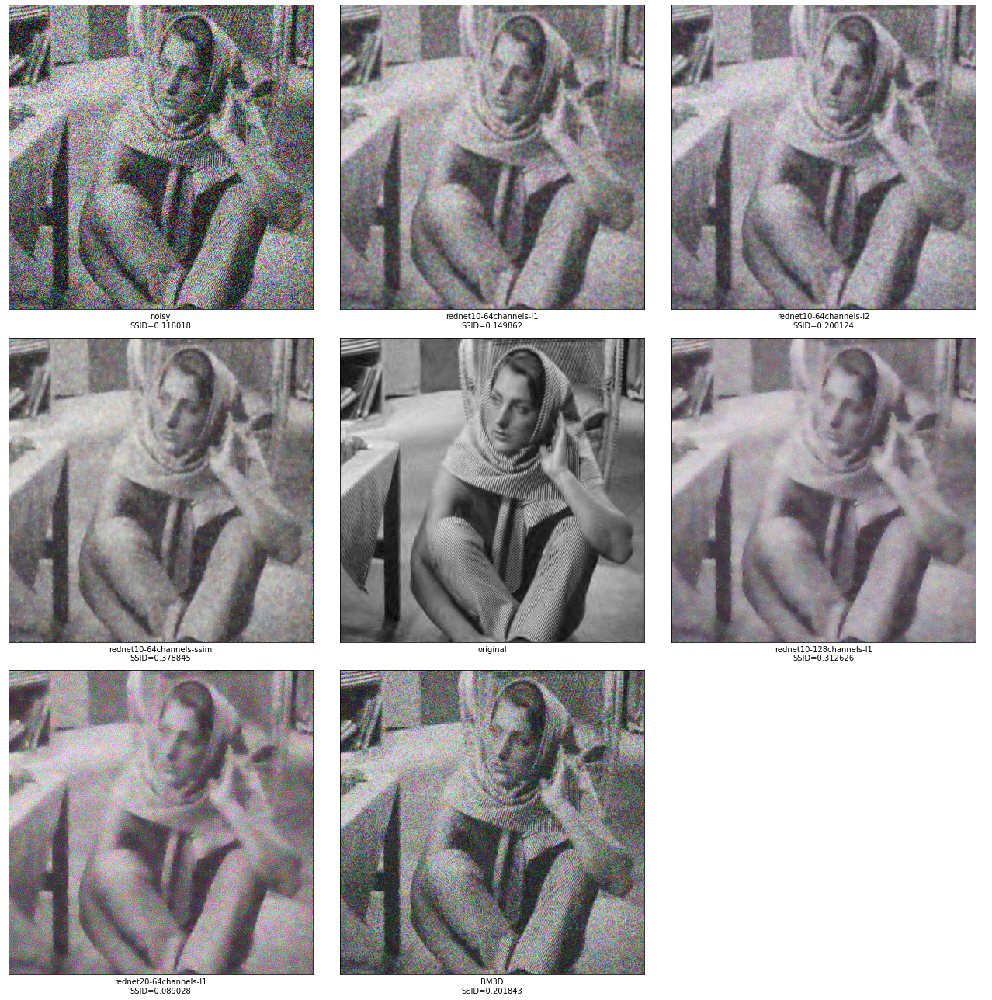

In [28]:
run_example("./images/barbara.png", device, sigma=0.3)

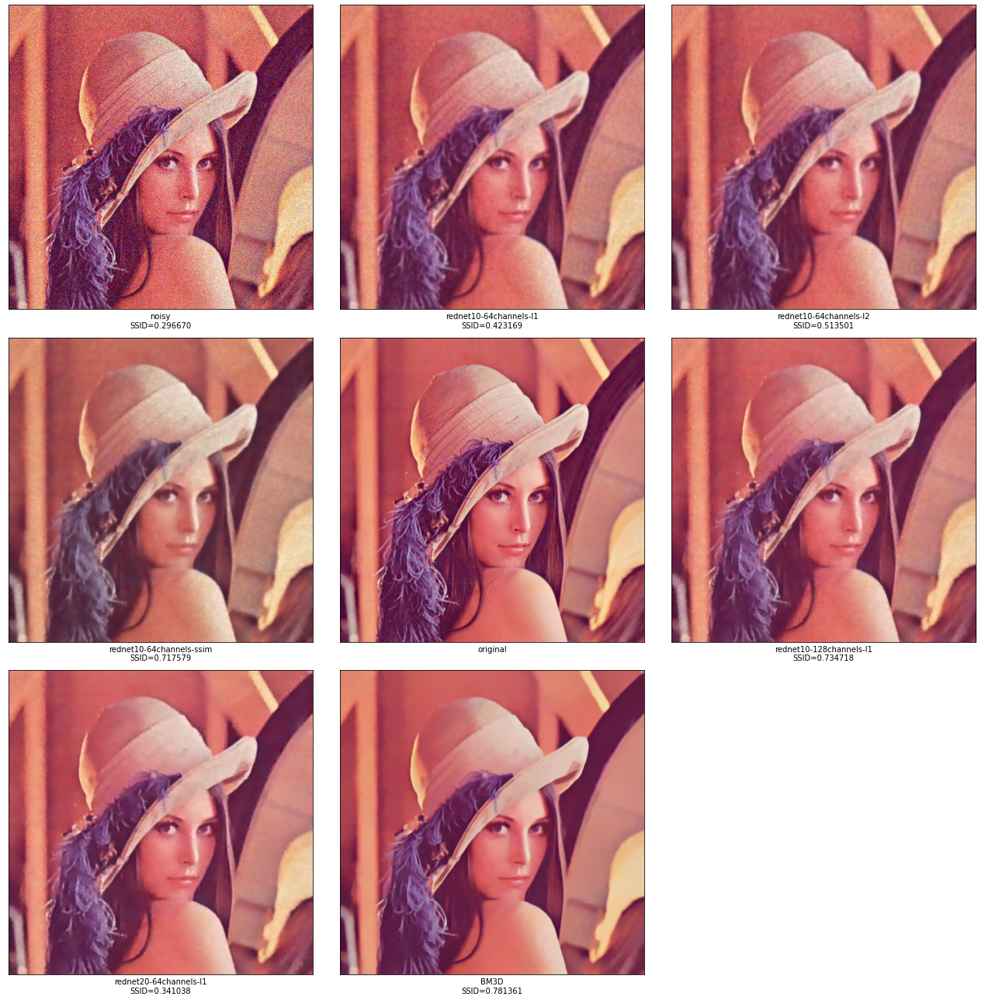

In [29]:
run_example("./images/lenna.png", device, sigma=0.1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


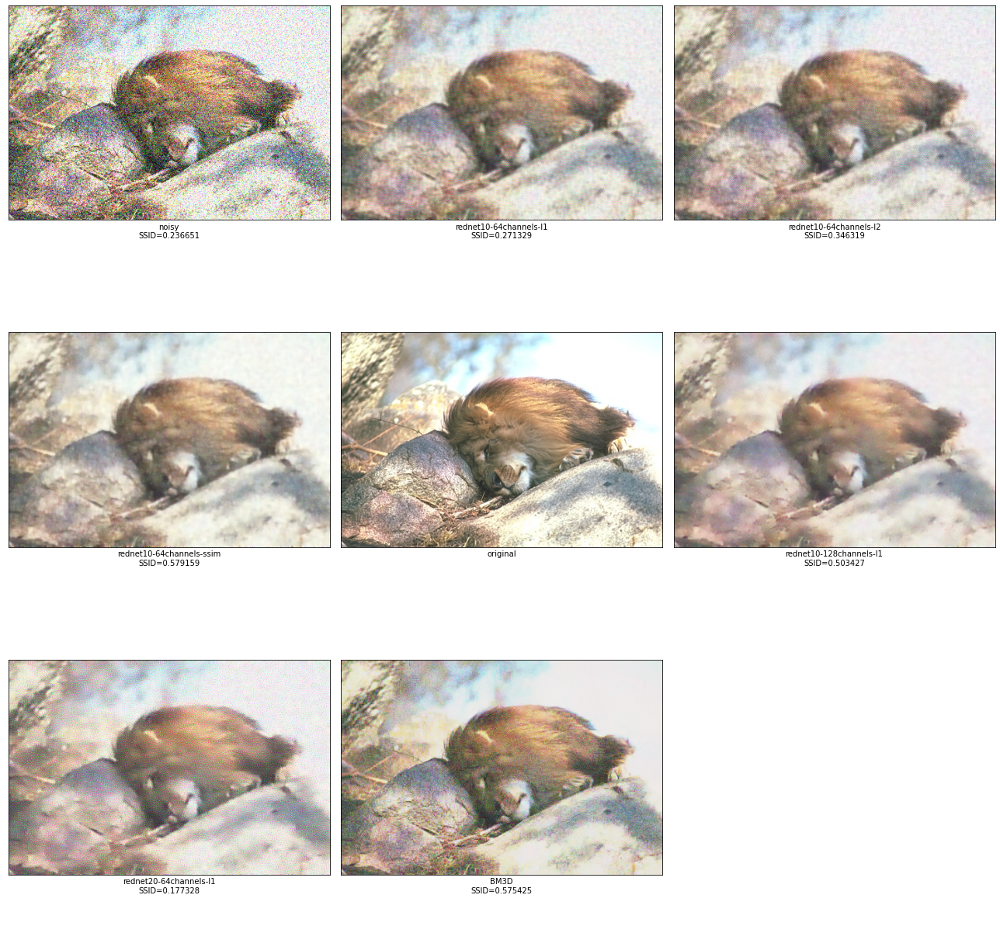

In [31]:
run_example("./images/lion.png", device, sigma=0.2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


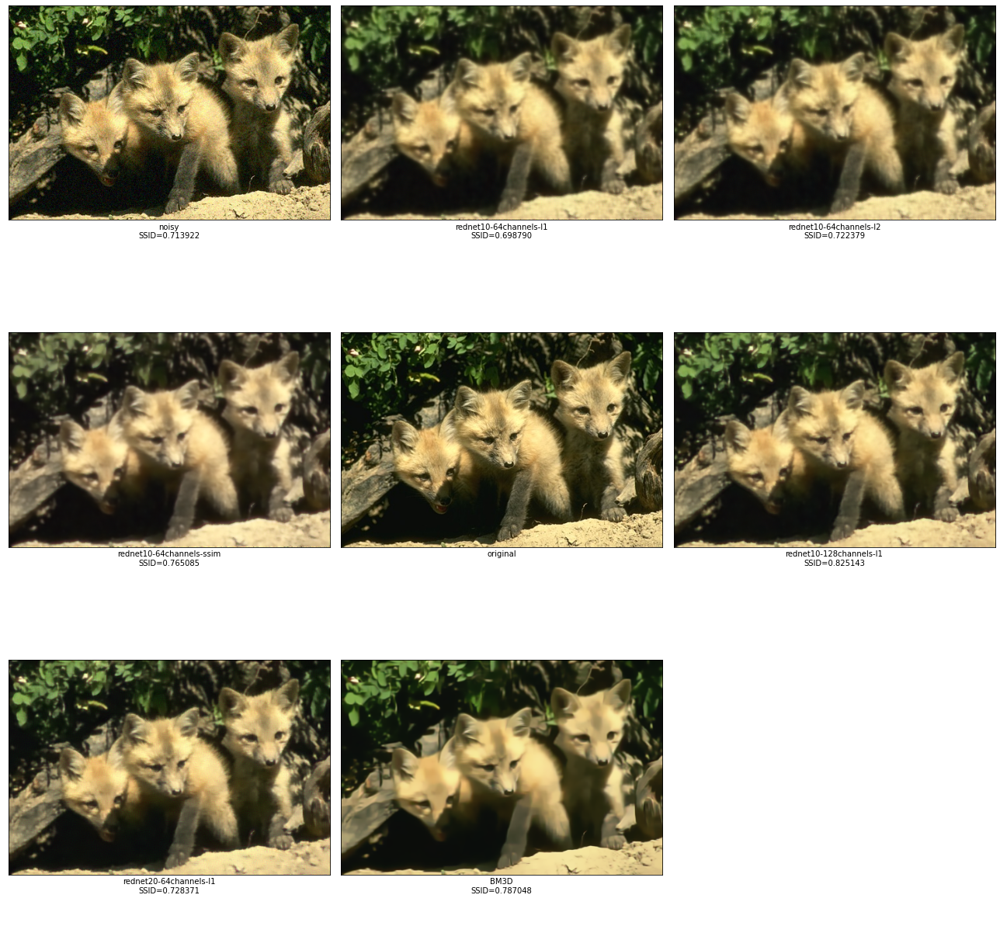

In [32]:
run_example("./images/foxes.png", device, sigma=0.05)

BM3D стирает мелкие детали. Например, на картинке с лисятами видно, что алгоритм затер текстуру меха, в то время как нейросетевые подходы ее сохранили. Также метод не справляется с сильно зашумленными изображениями.

Модели, обученные с разными функциями потерь, показали сильно отличающиеся результаты по SSID метрике. Лучше всего во всех тестах оказалась модель со SSID лоссом, хотя визуально она и меняет тон изображения. Это объясняется тем, что такая функция потерь напрямую оптимизирует метрику качества. L1 лосс в целом оказался хуже, чем L2, но это может быть связано с тем, что в тестах используется как раз гауссовский шум, под который и заточена MSE.

Большие модели сохраняют больше деталей. Например, REDNet-20 сохраняет текстуру меха у лис или перьев на шляпе Лены. При этом шум удаляется не полностью, что видно на примере картинки со львом.

Полоски на штанах у Барбары сохранить не удалось :(

В целом, кажется, что надо было взять модель побольше смогла бы показать результат сильно лучше BM3D.